Connect My drive

In [ ]:
!nvidia-smi -L

GPU 0: Tesla T4 (UUID: GPU-282d91c4-6122-350f-81e0-db178465981d)


In [ ]:
gpu_info = !nvidia-smi
gpu_info = '\n'.join(gpu_info)
if gpu_info.find('failed') >= 0:
  print('Not connected to a GPU')
else:
  print(gpu_info)

Sat Nov  4 18:42:07 2023       
+-----------------------------------------------------------------------------+
| NVIDIA-SMI 525.105.17   Driver Version: 525.105.17   CUDA Version: 12.0     |
|-------------------------------+----------------------+----------------------+
| GPU  Name        Persistence-M| Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp  Perf  Pwr:Usage/Cap|         Memory-Usage | GPU-Util  Compute M. |
|                               |                      |               MIG M. |
|===============================+======================+======================|
|   0  Tesla T4            Off  | 00000000:00:04.0 Off |                    0 |
| N/A   55C    P8    13W /  70W |      0MiB / 15360MiB |      0%      Default |
|                               |                      |                  N/A |
+-------------------------------+----------------------+----------------------+
                                                                               
+-------

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
!pip install wandb
!pip install keras-tuner
!pip install optuna


     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.1/2.1 MB 22.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 190.6/190.6 kB 25.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 243.9/243.9 kB 28.6 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 62.7/62.7 kB 9.9 MB/s eta 0:00:00
  Created wheel for pathtools: filename=pathtools-0.1.2-py3-none-any.whl size=8791 sha256=734f4033483f00e8a600571264aabf3d73a27a23b6c881db39e4c4e9daaca1ac
  Stored in directory: /root/.cache/pip/wheels/e7/f3/22/152153d6eb222ee7a56ff8617d80ee5207207a8c00a7aab794
Successfully built pathtools
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 129.5/129.5 kB 1.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 950.8/950.8 kB 13.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 409.6/409.6 kB 6.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 226.8/226.8 kB 29.0 MB/s eta 0:00:00
     ━━━━━━━━

**Import package**

In [ ]:
import os
import random
import shutil
import tensorflow as tf
import optuna
from tensorflow.keras.layers import Dense, GlobalAveragePooling2D
from tensorflow.keras.models import Model
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.applications import VGG16
from tensorflow.keras.optimizers import Adam
from wandb.keras import WandbCallback
import matplotlib.cm as cmp
import seaborn as sns

import matplotlib.pyplot as plt
import numpy as np  # Add this line to import NumPy
import kerastuner as kt
from tensorflow.keras.preprocessing.image import img_to_array
from tensorflow.keras.preprocessing.image import array_to_img
from tensorflow.keras.preprocessing.image import load_img
from tensorflow.keras.applications.inception_v3 import InceptionV3, preprocess_input
import wandb
from IPython.display import Image, display
import cv2



np.random.seed(1234)
tf.random.set_seed(5678)

print( f"TensorFlow {tf.__version__}" )
print( f"tf.keras.backend.image_data_format() = {tf.keras.backend.image_data_format()}" )
gpus = tf.config.list_physical_devices('GPU')
print( f"TensorFlow detected { len(gpus) } GPU(s):" )
for i, gpu in enumerate(gpus):
  print( f".... GPU No. {i}: Name = {gpu.name} , Type = {gpu.device_type}" )

Using TensorFlow backend


<ipython-input-5-d77823517e62>:17: DeprecationWarning: `import kerastuner` is deprecated, please use `import keras_tuner`.
  import kerastuner as kt


TensorFlow 2.14.0
tf.keras.backend.image_data_format() = channels_last
TensorFlow detected 1 GPU(s):
.... GPU No. 0: Name = /physical_device:GPU:0 , Type = GPU


Separate data set

In [ ]:
!unzip "/content/drive/MyDrive/Nida/CI7310 Deep Learning/data.zip"

เอาต์พุตของการสตรีมมีการตัดเหลือเพียง 5000 บรรทัดสุดท้าย
  inflating: data 4/planes/drone/00001004.jpeg  
  inflating: __MACOSX/data 4/planes/drone/._00001004.jpeg  
  inflating: data 4/planes/drone/00000640.jpg  
  inflating: __MACOSX/data 4/planes/drone/._00000640.jpg  
  inflating: data 4/planes/drone/00001238.jpg  
  inflating: __MACOSX/data 4/planes/drone/._00001238.jpg  
  inflating: data 4/planes/drone/00000126.jpg  
  inflating: __MACOSX/data 4/planes/drone/._00000126.jpg  
  inflating: data 4/planes/drone/00000132.jpg  
  inflating: __MACOSX/data 4/planes/drone/._00000132.jpg  
  inflating: data 4/planes/drone/00000318.png  
  inflating: __MACOSX/data 4/planes/drone/._00000318.png  
  inflating: data 4/planes/drone/00000683.jpg  
  inflating: __MACOSX/data 4/planes/drone/._00000683.jpg  
  inflating: data 4/planes/drone/00000708.jpg  
  inflating: __MACOSX/data 4/planes/drone/._00000708.jpg  
  inflating: data 4/planes/drone/00000087.jpeg  
  inflating: __MACOSX/data 4/planes/

In [ ]:
import os
import cv2
import numpy as np

# ตั้งค่าพารามิเตอร์
dataset_folder = "/content/data 4/planes"
img_size = (224, 224)  # ขนาดที่คุณต้องการ resize รูป

x_train = []
y_train = []

# วนลูปตามโฟลเดอร์ย่อยภายในโฟลเดอร์ planes
for class_folder in os.listdir(dataset_folder):
    class_path = os.path.join(dataset_folder, class_folder)

    if os.path.isdir(class_path):
        for filename in os.listdir(class_path):
            img_path = os.path.join(class_path, filename)

            # อ่านรูปภาพ
            img = cv2.imread(img_path, cv2.IMREAD_COLOR)

            # Check if the image was loaded successfully
            if img is None:
                print(f"Warning: Image not loaded for file: {img_path}")
                continue

            # img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)  # Convert จาก BGR เป็น RGB
            img = cv2.resize(img, img_size)

            x_train.append(img)
            y_train.append(class_folder)  # ใช้ชื่อโฟลเดอร์เป็น label



In [ ]:
x_train = np.array(x_train)
y_train = np.array(y_train)
print(x_train.shape)
print(y_train.shape)

(3853, 224, 224, 3)
(3853,)


In [ ]:
from sklearn.model_selection import train_test_split
x_train, x_test = train_test_split(x_train, test_size = 0.2, random_state = 1)
y_train, y_test = train_test_split(y_train, test_size = 0.2, random_state = 1)

print(x_train.shape)
print(y_train.shape)
print(x_test.shape)
print(y_test.shape)


(3082, 224, 224, 3)
(3082,)
(771, 224, 224, 3)
(771,)


In [ ]:
print( f"x_train: type={type(x_train)} , dtype={x_train.dtype} , shape={x_train.shape} , min={x_train.min(axis=None)} , max={x_train.max(axis=None)}" )
print( f"y_train: type={type(y_train)} , dtype={y_train.dtype} , shape={y_train.shape} , min={min(y_train)} , max={max(y_train)}" )
print( f"x_test: type={type(x_test)} , dtype={x_test.dtype} , shape={x_test.shape} , min={x_test.min(axis=None)} , max={x_test.max(axis=None)}"  )
print( f"y_test: type={type(y_test)} , dtype={y_test.dtype} , shape={y_test.shape} , min={min(y_test)} , max={max(y_test)}" )

x_train: type=<class 'numpy.ndarray'> , dtype=uint8 , shape=(3082, 224, 224, 3) , min=0 , max=255
y_train: type=<class 'numpy.ndarray'> , dtype=<U15 , shape=(3082,) , min=drone , max=rocket
x_test: type=<class 'numpy.ndarray'> , dtype=uint8 , shape=(771, 224, 224, 3) , min=0 , max=255
y_test: type=<class 'numpy.ndarray'> , dtype=<U15 , shape=(771,) , min=drone , max=rocket


In [ ]:
unique_labels = np.unique(y_train)
label_to_int = {label: i for i, label in enumerate(unique_labels)}

y_train = np.array([label_to_int[label] for label in y_train])
y_test = np.array([label_to_int[label] for label in y_test])

In [ ]:
x_train = x_train.astype('uint8')
x_test = x_test.astype('uint8')
y_train = y_train.astype('float32')
y_test = y_test.astype('float32')

In [ ]:
print( f"x_train: type={type(x_train)} , dtype={x_train.dtype} , shape={x_train.shape} , min={x_train.min(axis=None)} , max={x_train.max(axis=None)}" )
print( f"y_train: type={type(y_train)} , dtype={y_train.dtype} , shape={y_train.shape} , min={min(y_train)} , max={max(y_train)}" )
print( f"x_test: type={type(x_test)} , dtype={x_test.dtype} , shape={x_test.shape} , min={x_test.min(axis=None)} , max={x_test.max(axis=None)}"  )
print( f"y_test: type={type(y_test)} , dtype={y_test.dtype} , shape={y_test.shape} , min={min(y_test)} , max={max(y_test)}" )

x_train: type=<class 'numpy.ndarray'> , dtype=uint8 , shape=(3082, 224, 224, 3) , min=0 , max=255
y_train: type=<class 'numpy.ndarray'> , dtype=float32 , shape=(3082,) , min=0.0 , max=4.0
x_test: type=<class 'numpy.ndarray'> , dtype=uint8 , shape=(771, 224, 224, 3) , min=0 , max=255
y_test: type=<class 'numpy.ndarray'> , dtype=float32 , shape=(771,) , min=0.0 , max=4.0


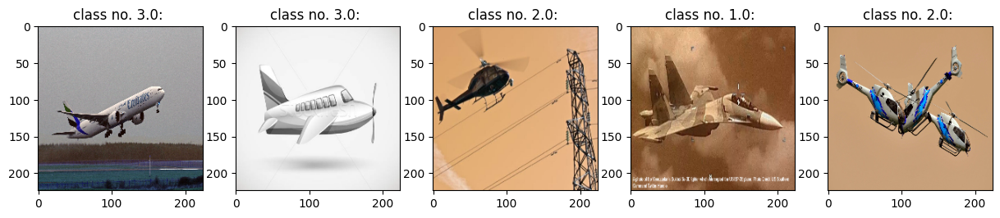

In [ ]:
plt.figure(figsize=(15,5))
for i in range(5):
    plt.subplot(150 + 1 + i).set_title( f"class no. {y_train[i]}: " )
    plt.imshow( x_train[i] )
    #plt.axis( "off" )
plt.show()

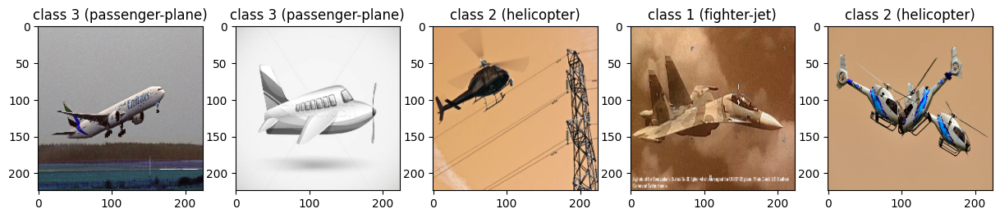

In [ ]:
#visualize the first 5 image of x_train
label = ['drone', 'fighter-jet', 'helicopter', 'passenger-plane', 'rocket']

plt.figure(figsize = (15,5))
for i in range(5):
  plt.subplot(150 + 1 + i).set_title(f'class {int(y_train[i])} ({label[int(y_train[i])]})')
  plt.imshow(x_train[i])
plt.show()


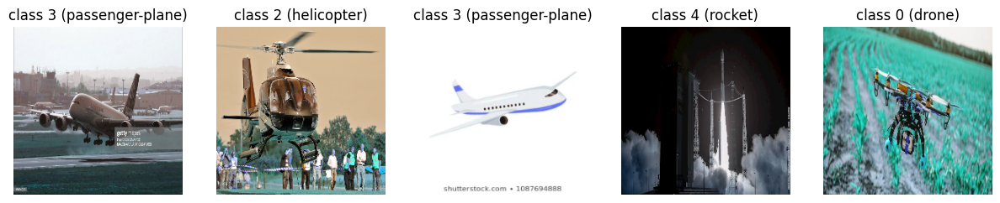

In [ ]:
plt.figure(figsize=(15,5))

for i in range(5):
    class_index = int(y_test[i])  # Cast the value to integer
    class_name = label[class_index]
    plt.subplot(150 + 1 + i).set_title(f'class {class_index} ({class_name})')
    plt.imshow(x_test[i])
    plt.axis('off')  # Hide axis for better visualization

plt.show()


# Pre-processing


In [ ]:
x_train_inception = preprocess_input(x_train)
x_test_inception = preprocess_input(x_test)

print(x_train_inception.shape)
print(x_test_inception.shape)

(3082, 224, 224, 3)
(771, 224, 224, 3)


# Data Augmentation

In [ ]:
train_datagen = tf.keras.preprocessing.image.ImageDataGenerator(
        samplewise_center=True,
        samplewise_std_normalization=True,
        rotation_range=0,
        width_shift_range=5.0,
        height_shift_range=5.0,
        zoom_range=0.2,
        horizontal_flip=True,
        vertical_flip=True,
        validation_split=0.3)
train_datagen.fit(x_train_inception)

test_datagen = tf.keras.preprocessing.image.ImageDataGenerator(
        #rescale=1. / 255,
        # featurewise_center=True,
        samplewise_center=True,
        # featurewise_std_normalization=True,
        samplewise_std_normalization=True
        )
test_datagen.fit(x_test_inception)

===== Train batch no. 1/1 =====


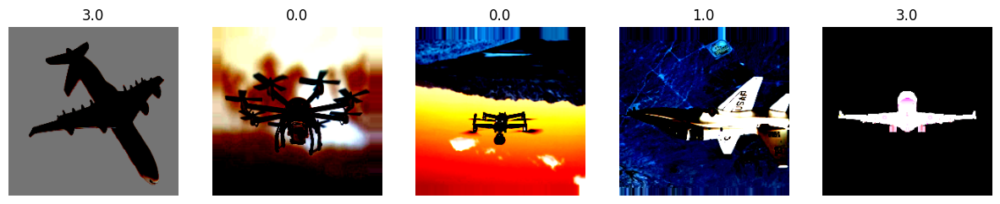

In [ ]:
n_show = 1    # show 'n_show' batches of generated data (1 batch includes 5 images)

for b, (x_batch, y_batch) in enumerate( train_datagen.flow( x_train, y_train, batch_size=5, subset='training' ) ):
  print( f"===== Train batch no. {b+1}/{n_show} =====" )
  plt.figure(figsize=(15,5))
  for i in range(5):
      plt.subplot(150 + 1 + i).set_title( y_batch[i] )
      plt.imshow( x_batch[i])
      plt.axis( "off" )        # remove all tick marks
  plt.show()

  if b+1 >= n_show:
    break


# Train **Data**

## No Fine Tuning

In [ ]:
# Load the VGG16 model with pre-trained weights (include_top=False to exclude the top classification layer)
base_model = tf.keras.applications.InceptionV3(weights='imagenet', include_top=False,input_shape = (img_size[0], img_size[1], 3))

# Freeze the layers of the pre-trained model
for layer in base_model.layers:
    layer.trainable = False
base_model.summary()

87910968/87910968 [==============================] - 5s 0us/step
Model: "inception_v3"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_1 (InputLayer)        [(None, 224, 224, 3)]        0         []                            
                                                                                                  
 conv2d (Conv2D)             (None, 111, 111, 32)         864       ['input_1[0][0]']             
                                                                                                  
 batch_normalization (Batch  (None, 111, 111, 32)         96        ['conv2d[0][0]']              
 Normalization)                                                                                   
                                                                                                  
 activation (Activatio

In [ ]:
tf.keras.utils.plot_model(base_model, to_file = 'InceptionV3_Model.png', show_shapes = True, show_dtype = False, show_layer_names = True, dpi = 300)

dot: graph is too large for cairo-renderer bitmaps. Scaling by 0.604792 to fit



In [ ]:
# Number of classes in your dataset
classes = ['drone', 'fighter-jet', 'helicopter', 'passenger-plane', 'rocket']

num_classes = len(np.unique(y_train))

# Add a Global Average Pooling layer and a Dense output layer
x = base_model.output
x = GlobalAveragePooling2D()(x)
x = Dense(1024, activation='relu')(x)
predictions = Dense(num_classes, activation='softmax')(x)

# Create a new model by combining the base model with the custom layers
model = Model(inputs=base_model.input, outputs=predictions)
model.summary()


Model: "model"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_1 (InputLayer)        [(None, 224, 224, 3)]        0         []                            
                                                                                                  
 conv2d (Conv2D)             (None, 111, 111, 32)         864       ['input_1[0][0]']             
                                                                                                  
 batch_normalization (Batch  (None, 111, 111, 32)         96        ['conv2d[0][0]']              
 Normalization)                                                                                   
                                                                                                  
 activation (Activation)     (None, 111, 111, 32)         0         ['batch_normalization[0][0

In [ ]:
tf.keras.utils.plot_model(model, to_file = 'InceptionV3_Model.png', show_shapes = True, show_dtype = False, show_layer_names = True, dpi = 96)

In [ ]:
!wandb login 3b6dca19e885b9cbf2e607df7c3594a13fa41ed4

wandb: Appending key for api.wandb.ai to your netrc file: /root/.netrc


In [ ]:
import wandb

project = "jirawat_inception" #@param {type:"string"}
epochs = 20 #@param {type:"number"}
learning_rate = 0.001 #@param {type:"number"}

config={
    "learning_rate": learning_rate,
    "architecture": "CNN",
    "dataset": "Air Vehicle",
    "epochs": epochs,
    }
# Initialize wandb with your project name and any other configuration you need
wandb.init(project=project,entity="deep-a",name=f'No fine tuning', config=config)


wandb: Currently logged in as: tar-relate (deep-a). Use `wandb login --relogin` to force relogin


In [ ]:
# Compile the model
model.compile(optimizer=Adam(learning_rate=learning_rate), loss='sparse_categorical_crossentropy', metrics=['accuracy'])

In [ ]:
history = model.fit(
    train_datagen.flow(x_train_inception ,y_train,batch_size=32,subset='training'),
    epochs = 20,
    verbose = 1,
    validation_data=train_datagen.flow(x_train_inception ,y_train,batch_size=32,subset='validation')
    ,callbacks=[WandbCallback()])
accuracy_values = history.history['accuracy']
mean_accuracy = np.mean(accuracy_values)
std_accuracy = np.std(accuracy_values)
loss_values = history.history['loss']
mean_loss = np.mean(loss_values)
std_loss = np.std(loss_values)

# Log mean and standard deviation on WandB
wandb.log({"Mean Accuracy": mean_accuracy, "SD Accuracy": std_accuracy})
wandb.log({"Mean Loss": mean_loss, "SD Loss": std_loss})
avg_epoch_time = np.mean(np.diff(history.epoch))  # Assuming 'history.epoch' contains epoch end times

# Log average epoch time on WandB
wandb.log({"Average Epoch Time": avg_epoch_time})

wandb: WARNING The save_model argument by default saves the model in the HDF5 format that cannot save custom objects like subclassed models and custom layers. This behavior will be deprecated in a future release in favor of the SavedModel format. Meanwhile, the HDF5 model is saved as W&B files and the SavedModel as W&B Artifacts.


Epoch 1/20
68/68 [==============================] - ETA: 0s - loss: 1.4256 - accuracy: 0.4866

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3079: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(
wandb: Adding directory to artifact (/content/wandb/run-20231104_184538-ybcnqrby/files/model-best)... Done. 0.5s


68/68 [==============================] - 95s 1s/step - loss: 1.4256 - accuracy: 0.4866 - val_loss: 1.0534 - val_accuracy: 0.5584
Epoch 2/20
68/68 [==============================] - ETA: 0s - loss: 0.9531 - accuracy: 0.6251

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3079: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(
wandb: Adding directory to artifact (/content/wandb/run-20231104_184538-ybcnqrby/files/model-best)... Done. 0.4s


68/68 [==============================] - 73s 1s/step - loss: 0.9531 - accuracy: 0.6251 - val_loss: 0.9482 - val_accuracy: 0.6201
Epoch 3/20
68/68 [==============================] - ETA: 0s - loss: 0.8781 - accuracy: 0.6497

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3079: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(
wandb: Adding directory to artifact (/content/wandb/run-20231104_184538-ybcnqrby/files/model-best)... Done. 0.4s


68/68 [==============================] - 75s 1s/step - loss: 0.8781 - accuracy: 0.6497 - val_loss: 0.9305 - val_accuracy: 0.6353
Epoch 4/20
68/68 [==============================] - 46s 672ms/step - loss: 0.8320 - accuracy: 0.6654 - val_loss: 0.9561 - val_accuracy: 0.6310
Epoch 5/20
68/68 [==============================] - 46s 675ms/step - loss: 0.8213 - accuracy: 0.6793 - val_loss: 0.9629 - val_accuracy: 0.6050
Epoch 6/20
68/68 [==============================] - ETA: 0s - loss: 0.7497 - accuracy: 0.7067

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3079: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(
wandb: Adding directory to artifact (/content/wandb/run-20231104_184538-ybcnqrby/files/model-best)... Done. 0.4s


68/68 [==============================] - 81s 1s/step - loss: 0.7497 - accuracy: 0.7067 - val_loss: 0.8759 - val_accuracy: 0.6558
Epoch 7/20
68/68 [==============================] - 46s 675ms/step - loss: 0.7574 - accuracy: 0.6928 - val_loss: 0.9263 - val_accuracy: 0.6439
Epoch 8/20
68/68 [==============================] - ETA: 0s - loss: 0.7312 - accuracy: 0.7085

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3079: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(
wandb: Adding directory to artifact (/content/wandb/run-20231104_184538-ybcnqrby/files/model-best)... Done. 0.5s


68/68 [==============================] - 74s 1s/step - loss: 0.7312 - accuracy: 0.7085 - val_loss: 0.8530 - val_accuracy: 0.6851
Epoch 9/20
68/68 [==============================] - 43s 629ms/step - loss: 0.6997 - accuracy: 0.7308 - val_loss: 1.0169 - val_accuracy: 0.6331
Epoch 10/20
68/68 [==============================] - 44s 653ms/step - loss: 0.6977 - accuracy: 0.7224 - val_loss: 0.8780 - val_accuracy: 0.6634
Epoch 11/20
68/68 [==============================] - 45s 665ms/step - loss: 0.6722 - accuracy: 0.7349 - val_loss: 0.9281 - val_accuracy: 0.6472
Epoch 12/20
68/68 [==============================] - 44s 657ms/step - loss: 0.6464 - accuracy: 0.7428 - val_loss: 0.9212 - val_accuracy: 0.6645
Epoch 13/20
68/68 [==============================] - 46s 680ms/step - loss: 0.6355 - accuracy: 0.7498 - val_loss: 0.9101 - val_accuracy: 0.6623
Epoch 14/20
68/68 [==============================] - 42s 628ms/step - loss: 0.6404 - accuracy: 0.7354 - val_loss: 0.8911 - val_accuracy: 0.6580
Epoch 15

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3079: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(
wandb: Adding directory to artifact (/content/wandb/run-20231104_184538-ybcnqrby/files/model-best)... Done. 0.3s


68/68 [==============================] - 72s 1s/step - loss: 0.6444 - accuracy: 0.7419 - val_loss: 0.8485 - val_accuracy: 0.6732
Epoch 16/20
68/68 [==============================] - 46s 672ms/step - loss: 0.6086 - accuracy: 0.7637 - val_loss: 0.8831 - val_accuracy: 0.6797
Epoch 17/20
68/68 [==============================] - 42s 624ms/step - loss: 0.6139 - accuracy: 0.7604 - val_loss: 0.8946 - val_accuracy: 0.6677
Epoch 18/20
68/68 [==============================] - 45s 662ms/step - loss: 0.6098 - accuracy: 0.7614 - val_loss: 0.8698 - val_accuracy: 0.6959
Epoch 19/20
68/68 [==============================] - 45s 660ms/step - loss: 0.5740 - accuracy: 0.7711 - val_loss: 0.8867 - val_accuracy: 0.6721
Epoch 20/20
68/68 [==============================] - 50s 736ms/step - loss: 0.5740 - accuracy: 0.7702 - val_loss: 0.9199 - val_accuracy: 0.6710


In [ ]:
model.save('inception_model.h5')
wandb.finish()


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3079: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


Average Epoch Time,▁
Mean Accuracy,▁
Mean Loss,▁
SD Accuracy,▁
SD Loss,▁
accuracy,▁▄▅▅▆▆▆▆▇▇▇▇▇▇▇█████
epoch,▁▁▂▂▂▃▃▄▄▄▅▅▅▆▆▇▇▇██
loss,█▄▄▃▃▂▃▂▂▂▂▂▂▂▂▁▁▁▁▁
val_accuracy,▁▄▅▅▃▆▅▇▅▆▆▆▆▆▇▇▇█▇▇
val_loss,█▄▄▅▅▂▄▁▇▂▄▃▃▂▁▂▃▂▂▃
Average Epoch Time,1.0


In [ ]:
results = model.evaluate(test_datagen.flow(x_test_inception, y_test, batch_size = 128))
print(f'{model.metrics_names}: {results}')

7/7 [==============================] - 8s 396ms/step - loss: 0.7608 - accuracy: 0.7224
['loss', 'accuracy']: [0.7607622742652893, 0.722438395023346]


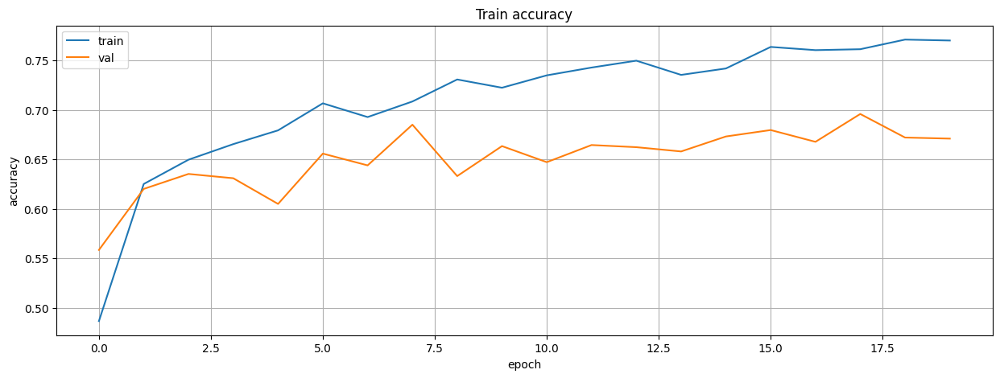

In [ ]:
#Summarize history of accuracy
plt.figure(figsize = (15,5))
plt.plot(history.history['accuracy'])
plt.plot(history.history['val_accuracy'])
plt.title('Train accuracy')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.legend(['train', 'val'], loc = 'upper left')
plt.grid()
plt.show()

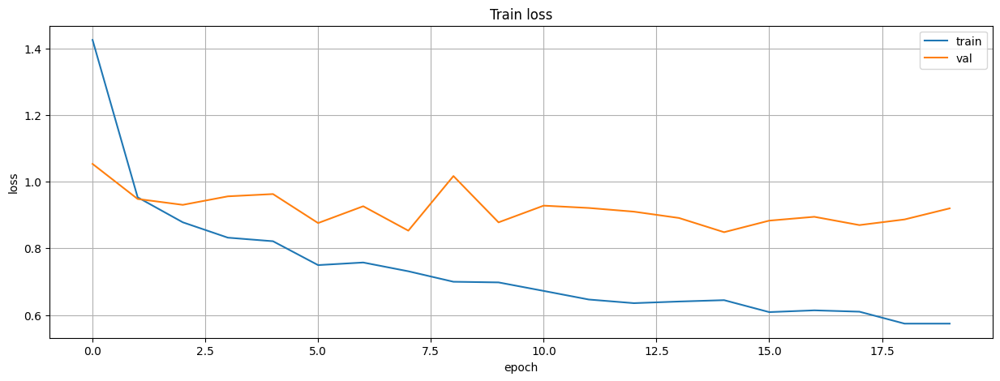

In [ ]:
#Summarize history for loss
plt.figure(figsize = (15,5))
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('Train loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend(['train', 'val'], loc = 'upper right')
plt.grid()
plt.show()

In [ ]:
plt.rcParams["axes.linewidth"] = 5

def color_frame( ax, y_true, y_pred ):
  color = 'green' if (y_true == y_pred) else 'red'
  ax.spines['bottom'].set_color(color)
  ax.spines['top'].set_color(color)
  ax.spines['right'].set_color(color)
  ax.spines['left'].set_color(color)

samples.shape=(10, 224, 224, 3)
1/1 [==============================] - 3s 3s/step


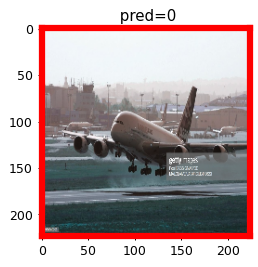

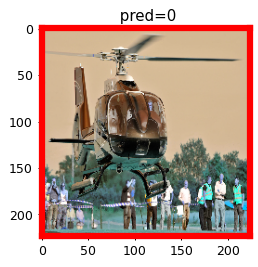

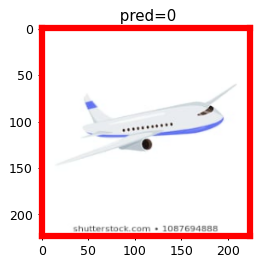

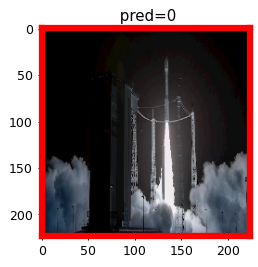

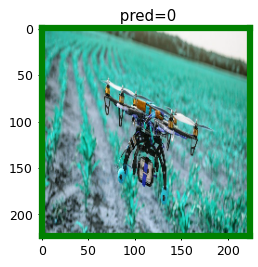

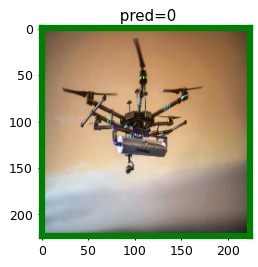

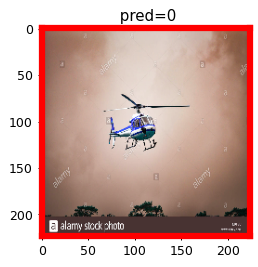

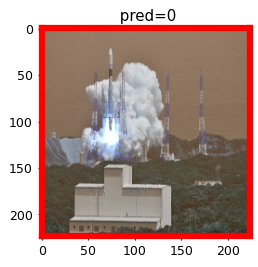

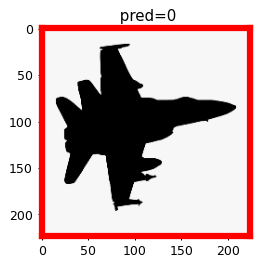

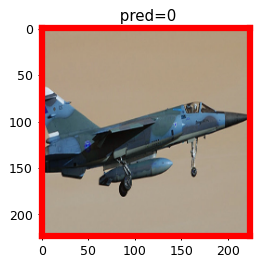

In [ ]:
# Test using the model on many images


# Get a batch of samples
n = 10
samples = x_test[:n]
print(f'{samples.shape=}')

# Predict a batch of samples
y_pred = model.predict(samples)

# Interpret the results
for i in range(n):
  plt.figure(figsize=(3,3), dpi=90)
  ax = plt.gca()
  plt.imshow( x_test[i] )
  plt.title(f" pred={np.argmax(y_pred[i])}")
  color_frame(ax, y_test[i], np.argmax(y_pred[i]))
  plt.show()

### GRAD-CAM

In [ ]:
model.summary()


Model: "model"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_1 (InputLayer)        [(None, 224, 224, 3)]        0         []                            
                                                                                                  
 conv2d (Conv2D)             (None, 111, 111, 32)         864       ['input_1[0][0]']             
                                                                                                  
 batch_normalization (Batch  (None, 111, 111, 32)         96        ['conv2d[0][0]']              
 Normalization)                                                                                   
                                                                                                  
 activation (Activation)     (None, 111, 111, 32)         0         ['batch_normalization[0][0

1/1 [==============================] - 4s 4s/step
Predicted: drone | Actual: drone 


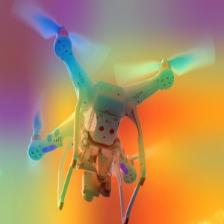

1/1 [==============================] - 0s 32ms/step
Predicted: helicopter | Actual: helicopter 


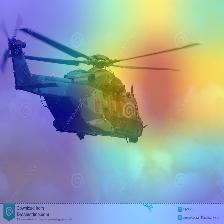

1/1 [==============================] - 0s 32ms/step
Predicted: helicopter | Actual: helicopter 


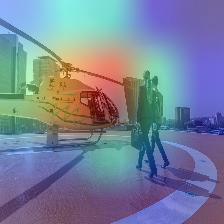

1/1 [==============================] - 0s 28ms/step
Predicted: helicopter | Actual: helicopter 


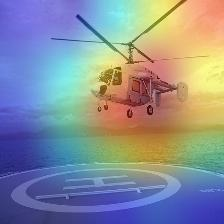

1/1 [==============================] - 0s 48ms/step
Predicted: fighter-jet | Actual: fighter-jet 


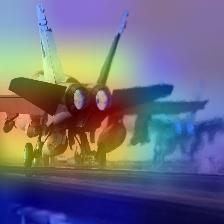

In [ ]:
import keras

img_size = (224, 224)
last_conv_layer_name = "mixed10"
from IPython.display import Image, display
import matplotlib.cm as cmp


def make_gradcam_heatmap(img_array, model, last_conv_layer_name, pred_index=None):
    grad_model = tf.keras.models.Model([model.inputs], [model.get_layer(last_conv_layer_name).output, model.output])
    with tf.GradientTape() as tape:
          last_conv_layer_output, preds = grad_model(img_array)
          if pred_index is None:
              pred_index = tf.argmax(preds[0])
          class_channel = preds[:, pred_index]
    grads = tape.gradient(class_channel, last_conv_layer_output)
    pooled_grads = tf.reduce_mean(grads, axis=(0, 1, 2))
    last_conv_layer_output = last_conv_layer_output[0]
    heatmap = last_conv_layer_output @ pooled_grads[..., tf.newaxis]
    heatmap = tf.squeeze(heatmap)
    heatmap = tf.maximum(heatmap, 0) / tf.math.reduce_max(heatmap)
    return heatmap.numpy()

def save_and_display_gradcam(img_path, heatmap, cam_path="cam.jpg", alpha=0.8):
      img = img_path

      # Rescale heatmap to a range 0-255
      heatmap = np.uint8(255 * heatmap)

      # Use jet colormap to colorize heatmap
      jet = plt.get_cmap("jet")

      # Use RGB values of the colormap
      jet_colors = jet(np.arange(256))[:, :3]
      jet_heatmap = jet_colors[heatmap]

      # Create an image with RGB colorized heatmap
      jet_heatmap = keras.preprocessing.image.array_to_img(jet_heatmap)
      jet_heatmap = jet_heatmap.resize((img.shape[1], img.shape[0]))
      jet_heatmap = keras.preprocessing.image.img_to_array(jet_heatmap)

      # Superimpose the heatmap on original image
      superimposed_img = jet_heatmap * alpha + img
      superimposed_img = keras.preprocessing.image.array_to_img(superimposed_img)

      # Save the superimposed image
      superimposed_img.save(cam_path)

      # Display Grad CAM
      display(Image(cam_path))

for i in range(5):
  c= np.random.randint(0,180)
  img_path = x_test[c]
  img_array = preprocess_input(img_path)
  model.layers[-1].activation = None
  preds = model.predict(img_array.reshape(-1,224,224,3))
  print(f"Predicted: {label[int(np.argmax(preds))]} | Actual: {label[int(y_test[c])]} ")
  heatmap = make_gradcam_heatmap(img_array.reshape(1,224,224,3), model, last_conv_layer_name)
  save_and_display_gradcam(img_path, heatmap)

## Fine tuning

In [ ]:
# Number of classes in your dataset
classes = ['drone', 'fighter-jet', 'helicopter', 'passenger-plane', 'rocket']

num_classes = len(classes)
base_model = tf.keras.applications.InceptionV3(weights='imagenet', include_top=False,input_shape = (img_size[0], img_size[1], 3))
# Freeze the layers of the pre-trained model
for layer in base_model.layers:
    layer.trainable = False

a = base_model.layers[152:159]
#a.trainable = True
#print(f'Layer {a}: Name = {a.name}, Trainable = {a.trainable}')
for i in a:
 i.trainable=True
b = base_model.layers[289:298]
#a.trainable = True
#print(f'Layer {a}: Name = {a.name}, Trainable = {a.trainable}')
for i in b:
 i.trainable=True

# Add a Global Average Pooling layer and a Dense output layer
x = base_model.output
x = GlobalAveragePooling2D()(x)
x = Dense(1024, activation='relu')(x)
x = tf.keras.layers.Dropout(0.5)(x)
predictions = Dense(num_classes, activation='softmax')(x)


# Create a new model by combining the base model with the custom layers
model = Model(inputs=base_model.input, outputs=predictions)
model.summary()

Model: "model_6"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_2 (InputLayer)        [(None, 224, 224, 3)]        0         []                            
                                                                                                  
 conv2d_94 (Conv2D)          (None, 111, 111, 32)         864       ['input_2[0][0]']             
                                                                                                  
 batch_normalization_94 (Ba  (None, 111, 111, 32)         96        ['conv2d_94[0][0]']           
 tchNormalization)                                                                                
                                                                                                  
 activation_94 (Activation)  (None, 111, 111, 32)         0         ['batch_normalization_94

In [ ]:

#Iterate over all layers in the model
for i, layer in enumerate(base_model.layers):
  print(f'Layer {i}: Name = {layer.name}, Trainable = {layer.trainable}')

Layer 0: Name = input_2, Trainable = False
Layer 1: Name = conv2d_94, Trainable = False
Layer 2: Name = batch_normalization_94, Trainable = False
Layer 3: Name = activation_94, Trainable = False
Layer 4: Name = conv2d_95, Trainable = False
Layer 5: Name = batch_normalization_95, Trainable = False
Layer 6: Name = activation_95, Trainable = False
Layer 7: Name = conv2d_96, Trainable = False
Layer 8: Name = batch_normalization_96, Trainable = False
Layer 9: Name = activation_96, Trainable = False
Layer 10: Name = max_pooling2d_4, Trainable = False
Layer 11: Name = conv2d_97, Trainable = False
Layer 12: Name = batch_normalization_97, Trainable = False
Layer 13: Name = activation_97, Trainable = False
Layer 14: Name = conv2d_98, Trainable = False
Layer 15: Name = batch_normalization_98, Trainable = False
Layer 16: Name = activation_98, Trainable = False
Layer 17: Name = max_pooling2d_5, Trainable = False
Layer 18: Name = conv2d_102, Trainable = False
Layer 19: Name = batch_normalization_102

In [ ]:
tf.keras.utils.plot_model(model, to_file = 'InceptionV3_Model_fine_tuning.png', show_shapes = True, show_dtype = False, show_layer_names = True, dpi = 96)

In [ ]:
!wandb login 3b6dca19e885b9cbf2e607df7c3594a13fa41ed4

wandb: Appending key for api.wandb.ai to your netrc file: /root/.netrc


In [ ]:
import wandb

project = "jirawat_inception" #@param {type:"string"}
epochs = 20 #@param {type:"number"}
learning_rate = 0.001 #@param {type:"number"}

# Number of training samples and steps per epoch
# num_train_samples = len(train_generator.filenames)
# steps_per_epoch = num_train_samples // batch_size

# # Number of validation samples and validation steps
# num_val_samples = len(test_generator.filenames)
# validation_steps = num_val_samples // batch_size



config={
    "learning_rate": learning_rate,
    "architecture": "CNN",
    "dataset": "Air Vehicle",
    "epochs": epochs,
    }
# Initialize wandb with your project name and any other configuration you need
wandb.init(project=project,entity="deep-a",name=f'fine tuning 152:159 289:298', config=config)


In [ ]:
# Compile the model
model.compile(optimizer=Adam(learning_rate=learning_rate), loss='sparse_categorical_crossentropy', metrics=['accuracy'])

In [ ]:
# Train the model
history = model.fit(train_datagen.flow(x_train_inception ,y_train,batch_size=32,subset='training'),epochs = 20, verbose = 1,
                    validation_data=train_datagen.flow(x_train_inception ,y_train,batch_size=32,subset='validation'),
                    callbacks=[WandbCallback()])
accuracy_values = history.history['accuracy']
mean_accuracy = np.mean(accuracy_values)
std_accuracy = np.std(accuracy_values)
loss_values = history.history['loss']
mean_loss = np.mean(loss_values)
std_loss = np.std(loss_values)

# Log mean and standard deviation on WandB
wandb.log({"Mean Accuracy": mean_accuracy, "SD Accuracy": std_accuracy})
wandb.log({"Mean Loss": mean_loss, "SD Loss": std_loss})
avg_epoch_time = np.mean(np.diff(history.epoch))  # Assuming 'history.epoch' contains epoch end times

# Log average epoch time on WandB
wandb.log({"Average Epoch Time": avg_epoch_time})

Epoch 1/20
68/68 [==============================] - ETA: 0s - loss: 1.5781 - accuracy: 0.4439

wandb: Adding directory to artifact (/content/wandb/run-20231104_190554-vozwamnx/files/model-best)... Done. 0.5s


68/68 [==============================] - 90s 1s/step - loss: 1.5781 - accuracy: 0.4439 - val_loss: 1.0135 - val_accuracy: 0.6093
Epoch 2/20
68/68 [==============================] - ETA: 0s - loss: 0.9203 - accuracy: 0.6335

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3079: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(
wandb: Adding directory to artifact (/content/wandb/run-20231104_190554-vozwamnx/files/model-best)... Done. 0.5s


68/68 [==============================] - 75s 1s/step - loss: 0.9203 - accuracy: 0.6335 - val_loss: 0.9795 - val_accuracy: 0.6212
Epoch 3/20
68/68 [==============================] - ETA: 0s - loss: 0.7116 - accuracy: 0.7294

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3079: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(
wandb: Adding directory to artifact (/content/wandb/run-20231104_190554-vozwamnx/files/model-best)... Done. 0.6s


68/68 [==============================] - 75s 1s/step - loss: 0.7116 - accuracy: 0.7294 - val_loss: 0.7699 - val_accuracy: 0.7359
Epoch 4/20
68/68 [==============================] - ETA: 0s - loss: 0.6492 - accuracy: 0.7706

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3079: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(
wandb: Adding directory to artifact (/content/wandb/run-20231104_190554-vozwamnx/files/model-best)... Done. 0.7s


68/68 [==============================] - 78s 1s/step - loss: 0.6492 - accuracy: 0.7706 - val_loss: 0.7157 - val_accuracy: 0.7338
Epoch 5/20
68/68 [==============================] - ETA: 0s - loss: 0.5759 - accuracy: 0.7864

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3079: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(
wandb: Adding directory to artifact (/content/wandb/run-20231104_190554-vozwamnx/files/model-best)... Done. 0.4s


68/68 [==============================] - 77s 1s/step - loss: 0.5759 - accuracy: 0.7864 - val_loss: 0.6474 - val_accuracy: 0.7825
Epoch 6/20
68/68 [==============================] - 42s 625ms/step - loss: 0.4843 - accuracy: 0.8211 - val_loss: 0.6673 - val_accuracy: 0.7727
Epoch 7/20
68/68 [==============================] - ETA: 0s - loss: 0.4292 - accuracy: 0.8448

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3079: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(
wandb: Adding directory to artifact (/content/wandb/run-20231104_190554-vozwamnx/files/model-best)... Done. 0.4s


68/68 [==============================] - 69s 1s/step - loss: 0.4292 - accuracy: 0.8448 - val_loss: 0.6369 - val_accuracy: 0.7835
Epoch 8/20
68/68 [==============================] - ETA: 0s - loss: 0.3694 - accuracy: 0.8712

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3079: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(
wandb: Adding directory to artifact (/content/wandb/run-20231104_190554-vozwamnx/files/model-best)... Done. 0.5s


68/68 [==============================] - 74s 1s/step - loss: 0.3694 - accuracy: 0.8712 - val_loss: 0.5694 - val_accuracy: 0.7965
Epoch 9/20
68/68 [==============================] - ETA: 0s - loss: 0.3291 - accuracy: 0.8804

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3079: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(
wandb: Adding directory to artifact (/content/wandb/run-20231104_190554-vozwamnx/files/model-best)... Done. 0.5s


68/68 [==============================] - 73s 1s/step - loss: 0.3291 - accuracy: 0.8804 - val_loss: 0.5192 - val_accuracy: 0.8225
Epoch 10/20
68/68 [==============================] - 51s 760ms/step - loss: 0.3252 - accuracy: 0.8855 - val_loss: 0.5891 - val_accuracy: 0.8214
Epoch 11/20
68/68 [==============================] - 43s 632ms/step - loss: 0.3036 - accuracy: 0.8943 - val_loss: 0.5202 - val_accuracy: 0.8312
Epoch 12/20
68/68 [==============================] - 43s 633ms/step - loss: 0.2703 - accuracy: 0.9036 - val_loss: 0.6210 - val_accuracy: 0.8139
Epoch 13/20
68/68 [==============================] - 41s 608ms/step - loss: 0.2452 - accuracy: 0.9055 - val_loss: 0.5643 - val_accuracy: 0.8171
Epoch 14/20
68/68 [==============================] - 43s 629ms/step - loss: 0.2399 - accuracy: 0.9198 - val_loss: 0.7265 - val_accuracy: 0.7965
Epoch 15/20
68/68 [==============================] - 43s 633ms/step - loss: 0.2260 - accuracy: 0.9133 - val_loss: 0.6033 - val_accuracy: 0.8301
Epoch 1

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3079: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(
wandb: Adding directory to artifact (/content/wandb/run-20231104_190554-vozwamnx/files/model-best)... Done. 0.5s


68/68 [==============================] - 81s 1s/step - loss: 0.1602 - accuracy: 0.9500 - val_loss: 0.5172 - val_accuracy: 0.8636
Epoch 20/20
68/68 [==============================] - 44s 649ms/step - loss: 0.1275 - accuracy: 0.9583 - val_loss: 0.6501 - val_accuracy: 0.8312


In [ ]:
model.save('fine_tuning_inception_model.h5')
wandb.finish()

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3079: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


Average Epoch Time,▁
Mean Accuracy,▁
Mean Loss,▁
SD Accuracy,▁
SD Loss,▁
accuracy,▁▄▅▅▆▆▆▇▇▇▇▇▇▇▇▇████
epoch,▁▁▂▂▂▃▃▄▄▄▅▅▅▆▆▇▇▇██
loss,█▅▄▄▃▃▂▂▂▂▂▂▂▂▁▁▁▁▁▁
val_accuracy,▁▁▄▄▆▅▆▆▇▇▇▇▇▆▇▇▆▇█▇
val_loss,██▅▄▃▃▃▂▁▂▁▂▂▄▂▃▄▁▁▃
Average Epoch Time,1.0


In [ ]:
results = model.evaluate(test_datagen.flow(x_test_inception, y_test, batch_size = 128))
print(f'{model.metrics_names}: {results}')

7/7 [==============================] - 2s 235ms/step - loss: 0.5299 - accuracy: 0.8599
['loss', 'accuracy']: [0.5299288034439087, 0.8599221706390381]


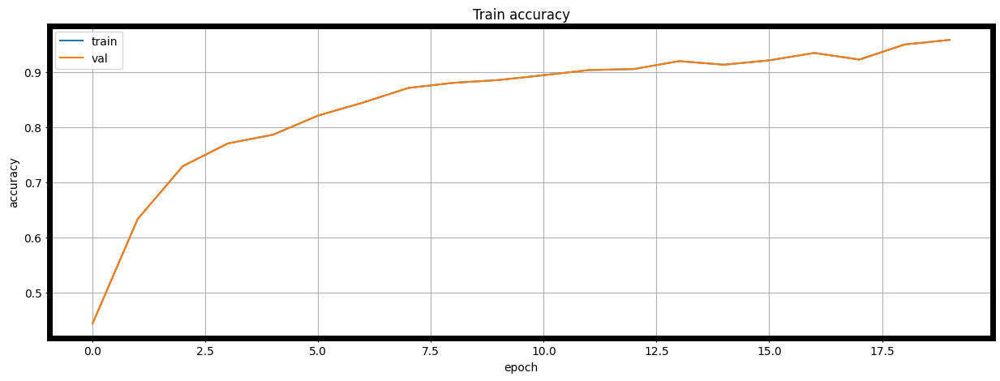

In [ ]:
#Summarize history of accuracy
plt.figure(figsize = (15,5))
plt.plot(history.history['accuracy'])
plt.plot(history.history['accuracy'])
plt.title('Train accuracy')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.legend(['train', 'val'], loc = 'upper left')
plt.grid()
plt.show()

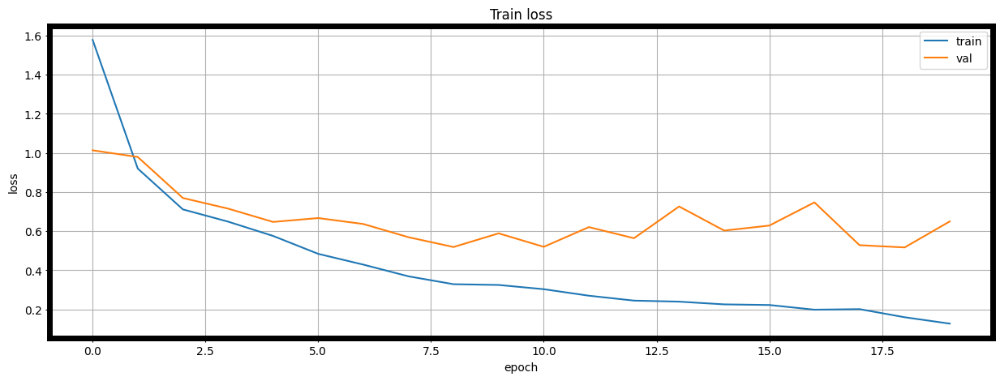

In [ ]:
#Summarize history for loss
plt.figure(figsize = (15,5))
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('Train loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend(['train', 'val'], loc = 'upper right')
plt.grid()
plt.show()

In [ ]:
plt.rcParams["axes.linewidth"] = 5

def color_frame( ax, y_true, y_pred ):
  color = 'green' if (y_true == y_pred) else 'red'
  ax.spines['bottom'].set_color(color)
  ax.spines['top'].set_color(color)
  ax.spines['right'].set_color(color)
  ax.spines['left'].set_color(color)

samples.shape=(10, 224, 224, 3)
1/1 [==============================] - 1s 1s/step


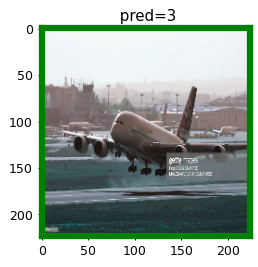

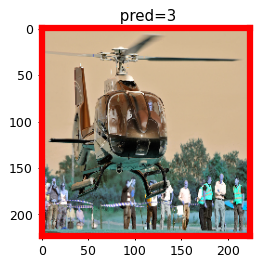

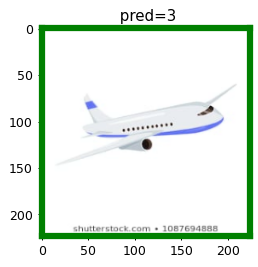

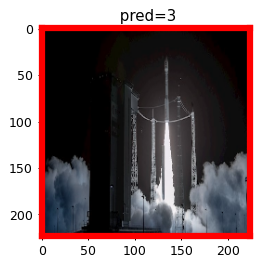

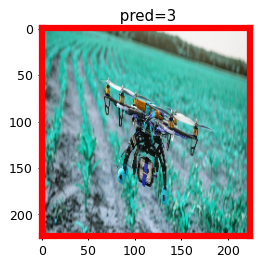

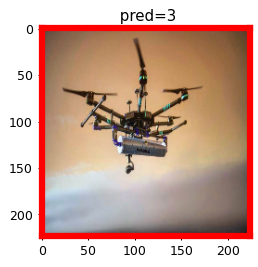

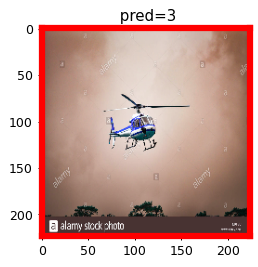

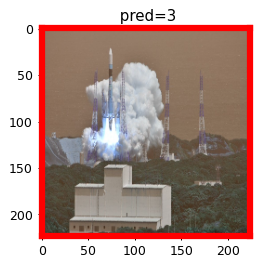

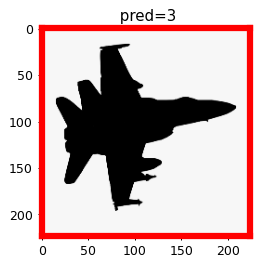

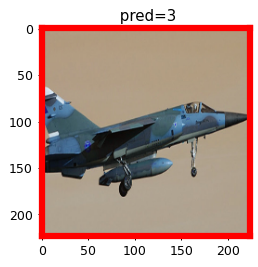

In [ ]:
# Test using the model on many images


# Get a batch of samples
n = 10
samples = x_test[:n]
print(f'{samples.shape=}')

# Predict a batch of samples
y_pred = model.predict(samples)

# Interpret the results
for i in range(n):
  plt.figure(figsize=(3,3), dpi=90)
  ax = plt.gca()
  plt.imshow( x_test[i] )
  plt.title(f" pred={np.argmax(y_pred[i])}")
  color_frame(ax, y_test[i], np.argmax(y_pred[i]))
  plt.show()

### GRAD-CAM

1/1 [==============================] - 1s 1s/step
Predicted: drone | Actual: fighter-jet 


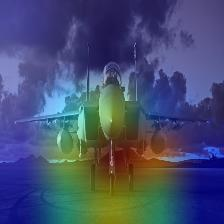

1/1 [==============================] - 0s 30ms/step
Predicted: helicopter | Actual: helicopter 


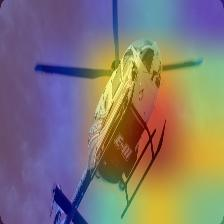

1/1 [==============================] - 0s 29ms/step
Predicted: rocket | Actual: rocket 


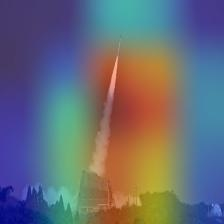

1/1 [==============================] - 0s 27ms/step
Predicted: rocket | Actual: rocket 


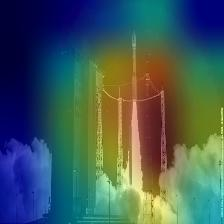

1/1 [==============================] - 0s 27ms/step
Predicted: helicopter | Actual: helicopter 


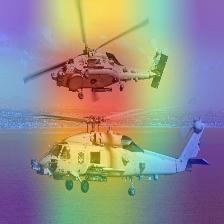

In [ ]:
import keras

img_size = (224, 224)
last_conv_layer_name = "mixed10"

from IPython.display import Image, display
import matplotlib.cm as cmp


def make_gradcam_heatmap(img_array, model, last_conv_layer_name, pred_index=None):
    grad_model = tf.keras.models.Model([model.inputs], [model.get_layer(last_conv_layer_name).output, model.output])
    with tf.GradientTape() as tape:
          last_conv_layer_output, preds = grad_model(img_array)
          if pred_index is None:
              pred_index = tf.argmax(preds[0])
          class_channel = preds[:, pred_index]
    grads = tape.gradient(class_channel, last_conv_layer_output)
    pooled_grads = tf.reduce_mean(grads, axis=(0, 1, 2))
    last_conv_layer_output = last_conv_layer_output[0]
    heatmap = last_conv_layer_output @ pooled_grads[..., tf.newaxis]
    heatmap = tf.squeeze(heatmap)
    heatmap = tf.maximum(heatmap, 0) / tf.math.reduce_max(heatmap)
    return heatmap.numpy()

def save_and_display_gradcam(img_path, heatmap, cam_path="cam.jpg", alpha=0.8):
      img = img_path

      # Rescale heatmap to a range 0-255
      heatmap = np.uint8(255 * heatmap)

      # Use jet colormap to colorize heatmap
      jet = plt.get_cmap("jet")

      # Use RGB values of the colormap
      jet_colors = jet(np.arange(256))[:, :3]
      jet_heatmap = jet_colors[heatmap]

      # Create an image with RGB colorized heatmap
      jet_heatmap = keras.preprocessing.image.array_to_img(jet_heatmap)
      jet_heatmap = jet_heatmap.resize((img.shape[1], img.shape[0]))
      jet_heatmap = keras.preprocessing.image.img_to_array(jet_heatmap)

      # Superimpose the heatmap on original image
      superimposed_img = jet_heatmap * alpha + img
      superimposed_img = keras.preprocessing.image.array_to_img(superimposed_img)

      # Save the superimposed image
      superimposed_img.save(cam_path)

      # Display Grad CAM
      display(Image(cam_path))

for i in range(5):
  c= np.random.randint(0,180)
  img_path = x_test[c]
  img_array = preprocess_input(img_path)
  model.layers[-1].activation = None
  preds = model.predict(img_array.reshape(-1,224,224,3))
  print(f"Predicted: {label[int(np.argmax(preds))]} | Actual: {label[int(y_test[c])]} ")
  heatmap = make_gradcam_heatmap(img_array.reshape(1,224,224,3), model, last_conv_layer_name)
  save_and_display_gradcam(img_path, heatmap)

---

# hypertuning

## No fine tuning

In [ ]:
classes = ['drone', 'fighter-jet', 'helicopter', 'passenger-plane', 'rocket']

num_classes = len(classes)
from tensorflow.keras.utils import to_categorical

y_train_encoded = to_categorical(y_train, num_classes)


def create_inception_model(learning_rate):
    # model = InceptionV3(weights='imagenet', include_top=False, input_shape=(224, 224, 3))
    # model.compile(
    #     optimizer=tf.keras.optimizers.Adam(learning_rate=learning_rate),
    #     loss='categorical_crossentropy',
    #     metrics=['accuracy']
    # )

    model = tf.keras.applications.InceptionV3(weights='imagenet', include_top=False)

    # Freeze the layers of the pre-trained model
    for layer in model.layers:
        layer.trainable = False
    x = model.output
    x = GlobalAveragePooling2D()(x)
    x = Dense(1024, activation='relu')(x)
    predictions = Dense(num_classes, activation='softmax')(x)

    model = Model(inputs=model.input, outputs=predictions)

    model.compile(
        optimizer=tf.keras.optimizers.Adam(learning_rate=learning_rate),
        loss='categorical_crossentropy',
        metrics=['accuracy']
    )
    return model

def objective(trial):
    # Step 3: Suggest hyperparameters
    learning_rate = trial.suggest_float("learning_rate", 0.001, 0.01)
    batch_size = trial.suggest_categorical("batch_size", [16, 32, 64])

    # Create the model
    model = create_inception_model(learning_rate)

    # Step 6: Set up WandB integration
    wandb.init(project="jirawat-inception-no-fine-hyper-tuning-3", config=trial.params)
    wandb.run.name = f"lr-{learning_rate}_bs-{batch_size}"

    # history = model.fit(
    #     train_generator,
    #     steps_per_epoch=len(train_generator),
    #     epochs=20,  # Adjust the number of epochs as needed
    #     validation_data=test_generator,
    #     validation_steps=len(test_generator)
    # )

    history = model.fit(train_datagen.flow(x_train_inception, y_train_encoded, batch_size=32, subset='training'), epochs=20, verbose=1,
                    validation_data=train_datagen.flow(x_train_inception, y_train_encoded, batch_size=32, subset='validation'),
                    callbacks=[WandbCallback()])

    # Log results to WandB
    wandb.log({"val_loss": history.history['val_loss'][-1], "val_accuracy": history.history['val_accuracy'][-1]})

    # Step 6: Close the WandB run
    wandb.run.finish()

    return history.history['val_loss'][-1]

# Step 5: Set up WandB
wandb.login(key='3b6dca19e885b9cbf2e607df7c3594a13fa41ed4')

# Step 6: Perform hyperparameter tuning
study = optuna.create_study(direction="minimize")
study.optimize(objective, n_trials=3)

# Get the best hyperparameters
best_params = study.best_params
print(f"Best hyperparameters: {best_params}")

# Save the best model with the chosen hyperparameters
best_learning_rate = best_params["learning_rate"]
best_batch_size = best_params["batch_size"]
wandb.log({"best_learning_rate": best_learning_rate, "best_batch_size": best_batch_size})

# Model setup
best_model = InceptionV3(weights=None, include_top=False, input_shape=(224, 224, 3))

# Rest of your code for hyperparameter tuning and saving the best model...

# Training the best model
best_model.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=best_learning_rate),
                  loss='categorical_crossentropy',
                  metrics=['accuracy'])
best_model.fit(train_datagen.flow(x_train_inception ,y_train,batch_size=32,subset='training'),epochs = 20, verbose = 1,
                    validation_data=train_datagen.flow(x_train_inception ,y_train,batch_size=32,subset='validation'),
                    callbacks=[WandbCallback()])

# Save the best model weights or entire model
best_model.save("best_inception_model.h5")

# Close WandB session
wandb.finish()

wandb: WARNING If you're specifying your api key in code, ensure this code is not shared publicly.
wandb: WARNING Consider setting the WANDB_API_KEY environment variable, or running `wandb login` from the command line.
wandb: Appending key for api.wandb.ai to your netrc file: /root/.netrc
[I 2023-11-04 19:26:09,652] A new study created in memory with name: no-name-f0fc2531-22ad-4b0d-bc23-4b76960eaa17


Epoch 1/20
68/68 [==============================] - ETA: 0s - loss: 2.1460 - accuracy: 0.4518

wandb: Adding directory to artifact (/content/wandb/run-20231104_192613-dv3m0a1l/files/model-best)... Done. 0.4s


68/68 [==============================] - 77s 1s/step - loss: 2.1460 - accuracy: 0.4518 - val_loss: 1.1381 - val_accuracy: 0.5195
Epoch 2/20
68/68 [==============================] - ETA: 0s - loss: 0.9918 - accuracy: 0.6043

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3079: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(
wandb: Adding directory to artifact (/content/wandb/run-20231104_192613-dv3m0a1l/files/model-best)... Done. 0.4s


68/68 [==============================] - 72s 1s/step - loss: 0.9918 - accuracy: 0.6043 - val_loss: 1.0627 - val_accuracy: 0.5693
Epoch 3/20
68/68 [==============================] - ETA: 0s - loss: 0.9424 - accuracy: 0.6228

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3079: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(
wandb: Adding directory to artifact (/content/wandb/run-20231104_192613-dv3m0a1l/files/model-best)... Done. 0.4s


68/68 [==============================] - 72s 1s/step - loss: 0.9424 - accuracy: 0.6228 - val_loss: 0.9898 - val_accuracy: 0.5974
Epoch 4/20
68/68 [==============================] - ETA: 0s - loss: 0.8555 - accuracy: 0.6562

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3079: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(
wandb: Adding directory to artifact (/content/wandb/run-20231104_192613-dv3m0a1l/files/model-best)... Done. 0.4s


68/68 [==============================] - 69s 1s/step - loss: 0.8555 - accuracy: 0.6562 - val_loss: 0.9275 - val_accuracy: 0.6385
Epoch 5/20
68/68 [==============================] - ETA: 0s - loss: 0.8418 - accuracy: 0.6728

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3079: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(
wandb: Adding directory to artifact (/content/wandb/run-20231104_192613-dv3m0a1l/files/model-best)... Done. 0.4s


68/68 [==============================] - 71s 1s/step - loss: 0.8418 - accuracy: 0.6728 - val_loss: 0.8804 - val_accuracy: 0.6472
Epoch 6/20
68/68 [==============================] - 43s 642ms/step - loss: 0.7710 - accuracy: 0.6905 - val_loss: 0.9006 - val_accuracy: 0.6385
Epoch 7/20
68/68 [==============================] - ETA: 0s - loss: 0.7759 - accuracy: 0.6840

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3079: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(
wandb: Adding directory to artifact (/content/wandb/run-20231104_192613-dv3m0a1l/files/model-best)... Done. 0.4s


68/68 [==============================] - 68s 1s/step - loss: 0.7759 - accuracy: 0.6840 - val_loss: 0.8722 - val_accuracy: 0.6602
Epoch 8/20
68/68 [==============================] - 43s 636ms/step - loss: 0.7596 - accuracy: 0.6895 - val_loss: 0.8761 - val_accuracy: 0.6407
Epoch 9/20
68/68 [==============================] - 43s 631ms/step - loss: 0.7358 - accuracy: 0.7113 - val_loss: 0.9967 - val_accuracy: 0.6190
Epoch 10/20
68/68 [==============================] - ETA: 0s - loss: 0.7095 - accuracy: 0.7183

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3079: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(
wandb: Adding directory to artifact (/content/wandb/run-20231104_192613-dv3m0a1l/files/model-best)... Done. 0.4s


68/68 [==============================] - 69s 1s/step - loss: 0.7095 - accuracy: 0.7183 - val_loss: 0.8718 - val_accuracy: 0.6537
Epoch 11/20
68/68 [==============================] - ETA: 0s - loss: 0.7052 - accuracy: 0.7243

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3079: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(
wandb: Adding directory to artifact (/content/wandb/run-20231104_192613-dv3m0a1l/files/model-best)... Done. 0.4s


68/68 [==============================] - 71s 1s/step - loss: 0.7052 - accuracy: 0.7243 - val_loss: 0.8653 - val_accuracy: 0.6645
Epoch 12/20
68/68 [==============================] - 44s 644ms/step - loss: 0.6848 - accuracy: 0.7187 - val_loss: 0.8981 - val_accuracy: 0.6439
Epoch 13/20
68/68 [==============================] - 43s 628ms/step - loss: 0.6920 - accuracy: 0.7322 - val_loss: 0.8867 - val_accuracy: 0.6688
Epoch 14/20
68/68 [==============================] - ETA: 0s - loss: 0.6438 - accuracy: 0.7465

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3079: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(
wandb: Adding directory to artifact (/content/wandb/run-20231104_192613-dv3m0a1l/files/model-best)... Done. 2.7s


68/68 [==============================] - 70s 1s/step - loss: 0.6438 - accuracy: 0.7465 - val_loss: 0.8586 - val_accuracy: 0.6656
Epoch 15/20
68/68 [==============================] - ETA: 0s - loss: 0.6592 - accuracy: 0.7484

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3079: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(
wandb: Adding directory to artifact (/content/wandb/run-20231104_192613-dv3m0a1l/files/model-best)... Done. 3.7s


68/68 [==============================] - 75s 1s/step - loss: 0.6592 - accuracy: 0.7484 - val_loss: 0.8370 - val_accuracy: 0.6840
Epoch 16/20
68/68 [==============================] - 43s 639ms/step - loss: 0.6268 - accuracy: 0.7567 - val_loss: 0.8989 - val_accuracy: 0.6656
Epoch 17/20
68/68 [==============================] - 43s 631ms/step - loss: 0.6312 - accuracy: 0.7451 - val_loss: 0.8820 - val_accuracy: 0.6829
Epoch 18/20
68/68 [==============================] - 43s 635ms/step - loss: 0.6216 - accuracy: 0.7530 - val_loss: 0.8405 - val_accuracy: 0.6775
Epoch 19/20
68/68 [==============================] - 40s 593ms/step - loss: 0.6324 - accuracy: 0.7646 - val_loss: 0.9833 - val_accuracy: 0.6385
Epoch 20/20
68/68 [==============================] - 43s 633ms/step - loss: 0.6459 - accuracy: 0.7424 - val_loss: 0.8900 - val_accuracy: 0.6450


accuracy,▁▄▅▆▆▆▆▆▇▇▇▇▇███████
epoch,▁▁▂▂▂▃▃▄▄▄▅▅▅▆▆▇▇▇██
loss,█▃▂▂▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁
val_accuracy,▁▃▄▆▆▆▇▆▅▇▇▆▇▇█▇██▆▆▆
val_loss,█▆▅▃▂▂▂▂▅▂▂▂▂▂▁▂▂▁▄▂▂
accuracy,0.74235
best_epoch,14
best_val_loss,0.83698
epoch,19
loss,0.64591
val_accuracy,0.64502


[I 2023-11-04 19:45:46,631] Trial 0 finished with value: 0.8900418877601624 and parameters: {'learning_rate': 0.0018271651433535124, 'batch_size': 32}. Best is trial 0 with value: 0.8900418877601624.


Epoch 1/20
68/68 [==============================] - ETA: 0s - loss: 2.7609 - accuracy: 0.4662

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3079: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(
wandb: Adding directory to artifact (/content/wandb/run-20231104_194549-y64ebfo5/files/model-best)... Done. 3.1s


68/68 [==============================] - 80s 1s/step - loss: 2.7609 - accuracy: 0.4662 - val_loss: 0.9998 - val_accuracy: 0.5909
Epoch 2/20
68/68 [==============================] - 44s 644ms/step - loss: 0.9744 - accuracy: 0.6043 - val_loss: 1.0673 - val_accuracy: 0.5714
Epoch 3/20
68/68 [==============================] - ETA: 0s - loss: 0.8834 - accuracy: 0.6339

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3079: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(
wandb: Adding directory to artifact (/content/wandb/run-20231104_194549-y64ebfo5/files/model-best)... Done. 2.5s


68/68 [==============================] - 74s 1s/step - loss: 0.8834 - accuracy: 0.6339 - val_loss: 0.9764 - val_accuracy: 0.6082
Epoch 4/20
68/68 [==============================] - ETA: 0s - loss: 0.8707 - accuracy: 0.6492

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3079: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(
wandb: Adding directory to artifact (/content/wandb/run-20231104_194549-y64ebfo5/files/model-best)... Done. 2.5s


68/68 [==============================] - 72s 1s/step - loss: 0.8707 - accuracy: 0.6492 - val_loss: 0.9550 - val_accuracy: 0.6374
Epoch 5/20
68/68 [==============================] - 41s 607ms/step - loss: 0.8486 - accuracy: 0.6608 - val_loss: 0.9632 - val_accuracy: 0.6234
Epoch 6/20
68/68 [==============================] - ETA: 0s - loss: 0.7883 - accuracy: 0.6886

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3079: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(
wandb: Adding directory to artifact (/content/wandb/run-20231104_194549-y64ebfo5/files/model-best)... Done. 2.6s


68/68 [==============================] - 74s 1s/step - loss: 0.7883 - accuracy: 0.6886 - val_loss: 0.8477 - val_accuracy: 0.6591
Epoch 7/20
68/68 [==============================] - 44s 649ms/step - loss: 0.7284 - accuracy: 0.7095 - val_loss: 0.8998 - val_accuracy: 0.6483
Epoch 8/20
68/68 [==============================] - 43s 634ms/step - loss: 0.7479 - accuracy: 0.7099 - val_loss: 0.9092 - val_accuracy: 0.6461
Epoch 9/20
68/68 [==============================] - 50s 745ms/step - loss: 0.7674 - accuracy: 0.6988 - val_loss: 0.9242 - val_accuracy: 0.6385
Epoch 10/20
68/68 [==============================] - 43s 637ms/step - loss: 0.7363 - accuracy: 0.7159 - val_loss: 0.9476 - val_accuracy: 0.6374
Epoch 11/20
68/68 [==============================] - 50s 747ms/step - loss: 0.7299 - accuracy: 0.7220 - val_loss: 0.9506 - val_accuracy: 0.6082
Epoch 12/20
68/68 [==============================] - 43s 633ms/step - loss: 0.7137 - accuracy: 0.7081 - val_loss: 0.9191 - val_accuracy: 0.6483
Epoch 13/2

accuracy,▁▄▅▅▆▆▇▇▇▇▇▇▇▇▇▇█▇▇█
epoch,▁▁▂▂▂▃▃▄▄▄▅▅▅▆▆▇▇▇██
loss,█▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁
val_accuracy,▂▁▃▅▄▆▆▅▅▅▃▆▆▄▅▆█▆▆▆▆
val_loss,▆█▅▄▅▁▃▃▃▄▄▃▃▃▇▄▁▁▄▄▄
accuracy,0.76182
best_epoch,5
best_val_loss,0.8477
epoch,19
loss,0.62601
val_accuracy,0.65909


[I 2023-11-04 20:03:43,428] Trial 1 finished with value: 0.9275475144386292 and parameters: {'learning_rate': 0.004361569537695799, 'batch_size': 16}. Best is trial 0 with value: 0.8900418877601624.


Epoch 1/20
68/68 [==============================] - ETA: 0s - loss: 2.7707 - accuracy: 0.4611

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3079: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(
wandb: Adding directory to artifact (/content/wandb/run-20231104_200345-ftydtju3/files/model-best)... Done. 2.7s


68/68 [==============================] - 79s 1s/step - loss: 2.7707 - accuracy: 0.4611 - val_loss: 1.0840 - val_accuracy: 0.5400
Epoch 2/20
68/68 [==============================] - ETA: 0s - loss: 0.9862 - accuracy: 0.6126

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3079: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(
wandb: Adding directory to artifact (/content/wandb/run-20231104_200345-ftydtju3/files/model-best)... Done. 0.4s


68/68 [==============================] - 71s 1s/step - loss: 0.9862 - accuracy: 0.6126 - val_loss: 0.9825 - val_accuracy: 0.6082
Epoch 3/20
68/68 [==============================] - ETA: 0s - loss: 0.9031 - accuracy: 0.6390

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3079: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(
wandb: Adding directory to artifact (/content/wandb/run-20231104_200345-ftydtju3/files/model-best)... Done. 0.4s


68/68 [==============================] - 70s 1s/step - loss: 0.9031 - accuracy: 0.6390 - val_loss: 0.9779 - val_accuracy: 0.5985
Epoch 4/20
68/68 [==============================] - 43s 626ms/step - loss: 0.8756 - accuracy: 0.6413 - val_loss: 0.9937 - val_accuracy: 0.6136
Epoch 5/20
68/68 [==============================] - 43s 634ms/step - loss: 0.8429 - accuracy: 0.6576 - val_loss: 1.0267 - val_accuracy: 0.5898
Epoch 6/20
68/68 [==============================] - ETA: 0s - loss: 0.8046 - accuracy: 0.6682

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3079: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(
wandb: Adding directory to artifact (/content/wandb/run-20231104_200345-ftydtju3/files/model-best)... Done. 2.6s


68/68 [==============================] - 81s 1s/step - loss: 0.8046 - accuracy: 0.6682 - val_loss: 0.9156 - val_accuracy: 0.6234
Epoch 7/20
68/68 [==============================] - ETA: 0s - loss: 0.7489 - accuracy: 0.7048

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3079: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(
wandb: Adding directory to artifact (/content/wandb/run-20231104_200345-ftydtju3/files/model-best)... Done. 2.4s


68/68 [==============================] - 74s 1s/step - loss: 0.7489 - accuracy: 0.7048 - val_loss: 0.8802 - val_accuracy: 0.6483
Epoch 8/20
68/68 [==============================] - 43s 630ms/step - loss: 0.7707 - accuracy: 0.7006 - val_loss: 0.9884 - val_accuracy: 0.5996
Epoch 9/20
68/68 [==============================] - 50s 739ms/step - loss: 0.7284 - accuracy: 0.7187 - val_loss: 0.9824 - val_accuracy: 0.6342
Epoch 10/20
68/68 [==============================] - 40s 593ms/step - loss: 0.7302 - accuracy: 0.7011 - val_loss: 0.9047 - val_accuracy: 0.6526
Epoch 11/20
68/68 [==============================] - 42s 625ms/step - loss: 0.7172 - accuracy: 0.7192 - val_loss: 0.8871 - val_accuracy: 0.6461
Epoch 12/20
68/68 [==============================] - ETA: 0s - loss: 0.6858 - accuracy: 0.7243

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3079: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(
wandb: Adding directory to artifact (/content/wandb/run-20231104_200345-ftydtju3/files/model-best)... Done. 0.4s


68/68 [==============================] - 72s 1s/step - loss: 0.6858 - accuracy: 0.7243 - val_loss: 0.8590 - val_accuracy: 0.6645
Epoch 13/20
68/68 [==============================] - 51s 754ms/step - loss: 0.6755 - accuracy: 0.7377 - val_loss: 0.9581 - val_accuracy: 0.6093
Epoch 14/20
68/68 [==============================] - 43s 628ms/step - loss: 0.6907 - accuracy: 0.7317 - val_loss: 0.9081 - val_accuracy: 0.6548
Epoch 15/20
68/68 [==============================] - 42s 628ms/step - loss: 0.6561 - accuracy: 0.7419 - val_loss: 0.9654 - val_accuracy: 0.6288
Epoch 16/20
68/68 [==============================] - 41s 596ms/step - loss: 0.6412 - accuracy: 0.7461 - val_loss: 1.1024 - val_accuracy: 0.5974
Epoch 17/20
68/68 [==============================] - 42s 621ms/step - loss: 0.6826 - accuracy: 0.7252 - val_loss: 1.0408 - val_accuracy: 0.6180
Epoch 18/20
68/68 [==============================] - 42s 623ms/step - loss: 0.6410 - accuracy: 0.7479 - val_loss: 0.8895 - val_accuracy: 0.6634
Epoch 1

accuracy,▁▅▅▅▆▆▇▇▇▇▇▇▇▇██▇███
epoch,▁▁▂▂▂▃▃▄▄▄▅▅▅▆▆▇▇▇██
loss,█▂▂▂▂▂▁▂▁▁▁▁▁▁▁▁▁▁▁▁
val_accuracy,▁▅▄▅▄▆▇▄▆▇▇█▅▇▆▄▅██▆▆
val_loss,▇▅▄▅▆▃▂▅▅▂▂▁▄▂▄█▆▂▂▃▃
accuracy,0.7544
best_epoch,11
best_val_loss,0.85904
epoch,19
loss,0.61227
val_accuracy,0.63745


[I 2023-11-04 20:22:19,401] Trial 2 finished with value: 0.930241048336029 and parameters: {'learning_rate': 0.002701225153885071, 'batch_size': 64}. Best is trial 0 with value: 0.8900418877601624.


Best hyperparameters: {'learning_rate': 0.0018271651433535124, 'batch_size': 32}


Error: ignored

## Fine tuning

In [ ]:
classes = ['drone', 'fighter-jet', 'helicopter', 'passenger-plane', 'rocket']

num_classes = len(classes)
from tensorflow.keras.utils import to_categorical

y_train_encoded = to_categorical(y_train, num_classes)

def create_inception_model(learning_rate):
    # model = InceptionV3(weights='imagenet', include_top=False, input_shape=(224, 224, 3))
    # model.compile(
    #     optimizer=tf.keras.optimizers.Adam(learning_rate=learning_rate),
    #     loss='categorical_crossentropy',
    #     metrics=['accuracy']
    # )

    model = tf.keras.applications.InceptionV3(weights='imagenet', include_top=False)

    # Freeze the layers of the pre-trained model
    for layer in model.layers:
        layer.trainable = False
    a = base_model.layers[289:298]
    for i in a:
      i.trainable=True

    x = model.output
    x = GlobalAveragePooling2D()(x)
    x = Dense(1024, activation='relu')(x)
    predictions = Dense(num_classes, activation='softmax')(x)

    model = Model(inputs=model.input, outputs=predictions)

    model.compile(
        optimizer=tf.keras.optimizers.Adam(learning_rate=learning_rate),
        loss='categorical_crossentropy',
        metrics=['accuracy']
    )
    return model

def objective(trial):
    # Step 3: Suggest hyperparameters
    learning_rate = trial.suggest_float("learning_rate", 0.001, 0.01)
    batch_size = trial.suggest_categorical("batch_size", [16, 32, 64])

    # Create the model
    model = create_inception_model(learning_rate)

    # Step 6: Set up WandB integration
    wandb.init(project="jirawat-inception-fine-tuning-hyper-tuning-3", config=trial.params)
    wandb.run.name = f"lr-{learning_rate}_bs-{batch_size}"

    history = model.fit(train_datagen.flow(x_train_inception, y_train_encoded, batch_size=32, subset='training'), epochs=20, verbose=1,
                    validation_data=train_datagen.flow(x_train_inception, y_train_encoded, batch_size=32, subset='validation'),
                    callbacks=[WandbCallback()])

    # Log results to WandB
    wandb.log({"val_loss": history.history['val_loss'][-1], "val_accuracy": history.history['val_accuracy'][-1]})

    # Step 6: Close the WandB run
    wandb.run.finish()

    return history.history['val_loss'][-1]

# Step 5: Set up WandB
wandb.login(key='3b6dca19e885b9cbf2e607df7c3594a13fa41ed4')

# Step 6: Perform hyperparameter tuning
study = optuna.create_study(direction="minimize")
study.optimize(objective, n_trials=3)

# Get the best hyperparameters
best_params = study.best_params
print(f"Best hyperparameters: {best_params}")

# Save the best model with the chosen hyperparameters
best_learning_rate = best_params["learning_rate"]
best_batch_size = best_params["batch_size"]
wandb.log({"best_learning_rate": best_learning_rate, "best_batch_size": best_batch_size})

# Model setup
best_model = InceptionV3(weights=None, include_top=False, input_shape=(224, 224, 3))

# Rest of your code for hyperparameter tuning and saving the best model...

# Training the best model
best_model.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=best_learning_rate),
                  loss='categorical_crossentropy',
                  metrics=['accuracy'])
best_model.fit(train_datagen.flow(x_train_inception ,y_train,batch_size=32,subset='training'),epochs = 20, verbose = 1,
                    validation_data=train_datagen.flow(x_train_inception ,y_train,batch_size=32,subset='validation'),
                    callbacks=[WandbCallback()])

# Save the best model weights or entire model
best_model.save("best_inception_model.h5")

# Close WandB session
wandb.finish()

In [ ]:
# import wandb
# wandb.init(project='jirawat_inception_hypertuning',entity="deep-a",name=f'hypertuning_20')

# num_classes = len(classes)

# def build_model(hp):
#     # Load the VGG16 model with pre-trained weights (include_top=False to exclude the top classification layer)
#     base_model = tf.keras.applications.InceptionV3(weights='imagenet', include_top=False)

#     # Freeze the layers of the pre-trained model
#     for layer in base_model.layers:
#         layer.trainable = False
#     x = base_model.output
#     x = GlobalAveragePooling2D()(x)
#     x = Dense(hp.Int('units', min_value=32, max_value=256, step=32, default=128), activation='relu')(x)
#     predictions = Dense(num_classes, activation='softmax')(x)

#     model = Model(inputs=base_model.input, outputs=predictions)

#     model.compile(
#         optimizer=Adam(hp.Choice('learning_rate', values=[0.1, 0.01, 0.001])),
#         loss='categorical_crossentropy',
#         metrics=['accuracy']
#     )

#     return model
# # Define a Keras Tuner Hyperband tuner with WandbCallback
# tuner = kt.Hyperband(
#     build_model,
#     objective='val_accuracy',
#     max_epochs=30,
#     factor=3,
#     directory='hyperband_tuning',
#     project_name='my_inception_tuning'
# )

# # Add WandbCallback to the Keras Tuner search
# tuner.search(train_datagen.flow(x_train_inception ,y_train,batch_size=32,subset='training'),epochs = 20, verbose = 1,
#                     validation_data=train_datagen.flow(x_train_inception ,y_train,batch_size=32,subset='validation'),
#                     callbacks=[WandbCallback()]
# )

# # Get the best hyperparameters
# best_hps = tuner.get_best_hyperparameters(num_trials=50)[0]
# print("Best Hyperparameters:")
# print(f"Units: {best_hps.get('units')}")
# print(f"Learning Rate: {best_hps.get('learning_rate')}")

# best_model = build_model(best_hps)

# # Train the model with the best hyperparameters
# # best_model.fit(
# #     train_generator,
# #     validation_data=test_generator,
# #     steps_per_epoch=len(train_generator),
# #     validation_steps=len(test_generator),
# #     epochs=20,
# #     verbose=1,
# #     callbacks=[WandbCallback()]
# # )
# best_model.fit(train_datagen.flow(x_train_inception ,y_train,batch_size=32,subset='training'),epochs = 20, verbose = 1,
#                     validation_data=train_datagen.flow(x_train_inception ,y_train,batch_size=32,subset='validation'),
#                     callbacks=[WandbCallback()])
# # Save the final model
# best_model.save('tuned_inception_model.h5')
# wandb.finish()
